### Data Preparation

In [1]:
#loading data

import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline


In [4]:
df = pd.read_csv(r'creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
df.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

In [6]:
from skimpy import skim

skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 284807 │ │ float64     │ 30    │                                                          │
│ │ Number of columns │ 31     │ │ int32       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name   ┃ NA  ┃ NA %  ┃ mean       ┃ sd     ┃ p0    ┃ p25     ┃ p50      ┃ p75     ┃ p100   ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩  │
│ │ Time          │   0 │     0 │      95000 │  47000 │     0 │   54000 │    85000 │  140000 │ 170000 │ ▂▇▇▂▇▇ │  │
│ │ V1            │   0 │     0 │    1.2e-15 │      2 │   -56 │   -0.92 │    0.018 │     1.3 │    2.5 │      ▇ │  │
│ │ V2            │   0 │     0 │    3.4e-16 │    1.7 │   -73 │    -0.6 │    0.065 │     0.8 │     22 │     ▇  │  │
│ │ V3            │   0 │     0 │   -1.4e-15 │    1.5 │   -48 │   -0.89 │     0.18 │       1 │    9.4 │     ▅▇ │  │
│ │ V4            │   0 │     0 │    2.1e-15 │    1.4 │  -5.7 │   -0.85 │    -0.02 │    0.74 │     17 │  ▁▇▁   │  │
│ │ V5            │   0 │     0 │    9.6e-16 │    1.4 │  -110 │   -0.69 │   -0.054 │    0.61 │     35 │     ▇  │  │
│ │ V6            │   0 │     0 │    1.5e-15 │    1.3 │   -26 │   -0.77 │    -0.27 │     0.4 │     73 │    ▇   │  │
│ │ V7            │   0 │     0 │   -5.6e-16 │    1.2 │   -44 │   -0.55 │     0.04 │    0.57 │    120 │    ▇   │  │
│ │ V8            │   0 │     0 │    1.2e-16 │    1.2 │   -73 │   -0.21 │    0.022 │    0.33 │     20 │     ▇  │  │
│ │ V9            │   0 │     0 │   -2.4e-15 │    1.1 │   -13 │   -0.64 │   -0.051 │     0.6 │     16 │    ▇▁  │  │
│ │ V10           │   0 │     0 │    2.2e-15 │    1.1 │   -25 │   -0.54 │   -0.093 │    0.45 │     24 │    ▃▇  │  │
│ │ V11           │   0 │     0 │    1.7e-15 │      1 │  -4.8 │   -0.76 │   -0.033 │    0.74 │     12 │   ▇▂   │  │
│ │ V12           │   0 │     0 │   -1.2e-15 │      1 │   -19 │   -0.41 │     0.14 │    0.62 │    7.8 │    ▁▇  │  │
│ │ V13           │   0 │     0 │    8.2e-16 │      1 │  -5.8 │   -0.65 │   -0.014 │    0.66 │    7.1 │   ▁▇▃  │  │
│ │ V14           │   0 │     0 │    1.2e-15 │   0.96 │   -19 │   -0.43 │    0.051 │    0.49 │     11 │    ▇▂  │  │
│ │ V15           │   0 │     0 │    4.9e-15 │   0.92 │  -4.5 │   -0.58 │    0.048 │    0.65 │    8.9 │   ▇▇   │  │
│ │ V16           │   0 │     0 │    1.4e-15 │   0.88 │   -14 │   -0.47 │    0.066 │    0.52 │     17 │    ▇   │  │
│ │ V17           │   0 │     0 │   -3.8e-16 │   0.85 │   -25 │   -0.48 │   -0.066 │     0.4 │    9.3 │     ▇  │  │
│ │ V18           │   0 │     0 │    9.6e-16 │   0.84 │  -9.5 │    -0.5 │  -0.0036 │     0.5 │      5 │    ▇▅  │  │
│ │ V19           │   0 │     0 │      1e-15 │   0.81 │  -7.2 │   -0.46 │   0.0037 │    0.46 │    5.6 │    ▁▇  │  │
│ │ V20           │   0 │     0 │    6.4e-16 │   0.77 │   -54 │   -0.21 │   -0.062 │    0.13 │     39 │     ▇  │  │
│ │ V21           │   0 │     0 │    1.7e-16 │   0.73 │   -35 │   -0.23 │   -0.029 │    0.19 │     27 │     ▇  │  │
│ │ V22           │   0 │     0 │   -3.6e-16 │   0.73 │ 

In [6]:
df.Time.head(15)

0      0.0
1      0.0
2      1.0
3      1.0
4      2.0
5      2.0
6      4.0
7      7.0
8      7.0
9      9.0
10    10.0
11    10.0
12    10.0
13    11.0
14    12.0
Name: Time, dtype: float64

### Insights

1. **Elapsed Time:** The values are increasing, suggesting they represent elapsed time. For instance, 0.0 could mean the timestamp of the first transaction, 1.0 could be one second after the first transaction.

## checking percentage of null values

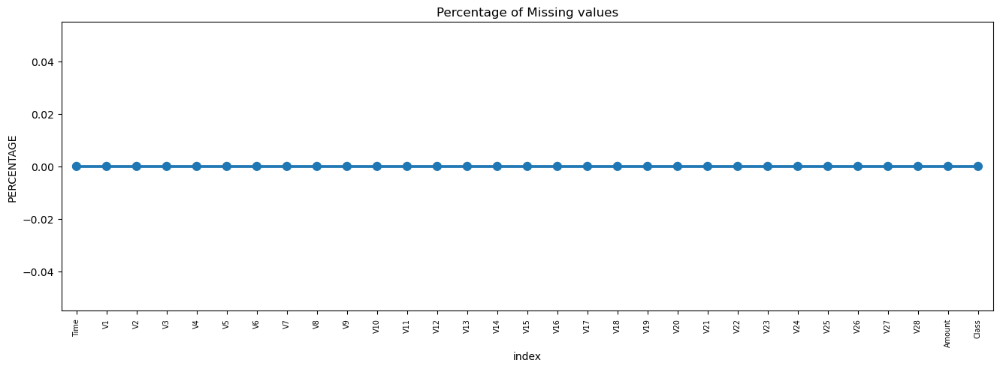

In [7]:
missing = pd.DataFrame((df.isnull().sum()) * 100 / df.shape[0]).reset_index()
plt.figure(figsize=(16, 5))
ax = sns.pointplot(x='index', y=0, data=missing)
plt.xticks(rotation=90, fontsize=7)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

No missing values in the dataset.

## checking for duplicates

In [8]:
df.duplicated().sum()

1081

In [9]:
df.drop_duplicates(inplace=True)

### Detecting outliers

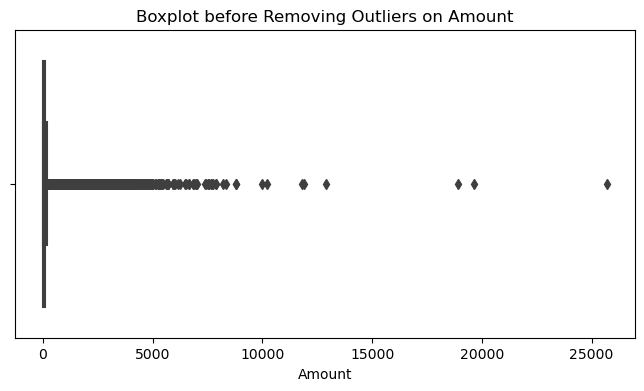

In [10]:

# Create a boxplot using seaborn
plt.figure(figsize=(8, 4))
sns.boxplot(x=df['Amount'])
plt.title('Boxplot before Removing Outliers on Amount')
plt.show()

### Removing outliers

In [12]:
# Function to Detection Outlier on one-dimentional datasets.
def remove_outliers(data, k=1.5):
    # Calculate quartiles using numpy
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)

    # Calculate interquartile range (IQR)
    IQR = Q3 - Q1

    # Calculate lower and upper fences
    lower_fence = Q1 - k * IQR
    upper_fence = Q3 + k * IQR

    # Filter the data to remove outliers
    filtered_data = data[(data >= lower_fence) & (data <= upper_fence)]
    
    return pd.Series(filtered_data)

In [13]:
# Create a copy of the DataFrame
df_cleaned = df.copy()

df_cleaned['Amount'] = remove_outliers(df_cleaned['Amount'])


In [14]:
# Imputeing NAN with Mean:

df_cleaned['Amount'].fillna(df_cleaned['Amount'].mean(), inplace=True)


In [15]:
df_cleaned.shape

(283726, 31)

### Class Distribution

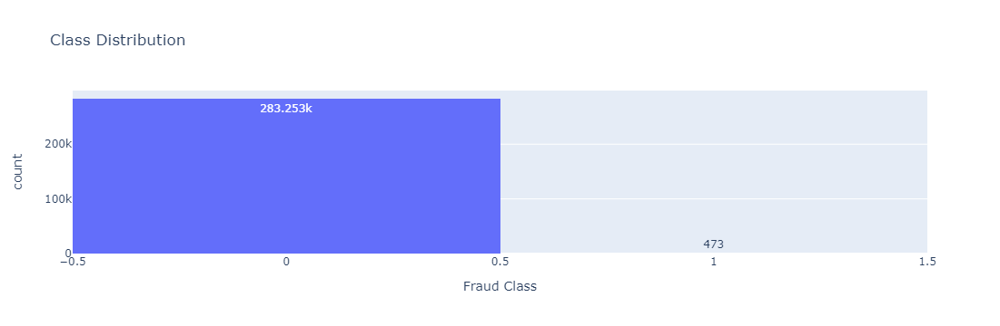

In [16]:


fig = px.histogram(df_cleaned, x="Class", title='Class Distribution', labels={'Class':'Fraud Class'}, text_auto=True)
fig.show()



## Insights
1. **Class Imbalance**: There is a significant class imbalance. Class '0' (non-fraudulent) has a  higher count compared to class '1' (fraudulent), which is typical in fraud detection scenarios. This implies that most transactions are not fraudulent.

## Time Feature Analysis

In [17]:
# Downsample the data for efficient visualization
df_sampled = df_cleaned.sample(n=10000, random_state=1)

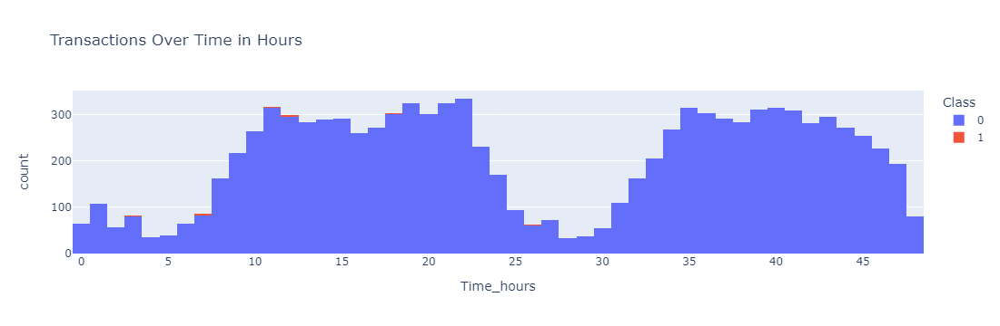

In [18]:

# Convert time to hours for better interpretation
df_sampled['Time_hours'] = df_sampled['Time'] / 3600 

fig = px.histogram(df_sampled, x="Time_hours", color="Class", title='Transactions Over Time in Hours')
fig.show()



### Insights
1. **Fraud Occurrences:** The red markings for Class 1 are sparse, indicating that fraudulent transactions are much less frequent than non-fraudulent ones, which is expected in a fraud detection dataset.
2. **Time of Fraud:** It does not seem like there is a consistent pattern in the time when fraud occurs compared to the overall transaction volume. Fraudulent transactions are scattered throughout.

### Scatter Plot for Amount vs Class

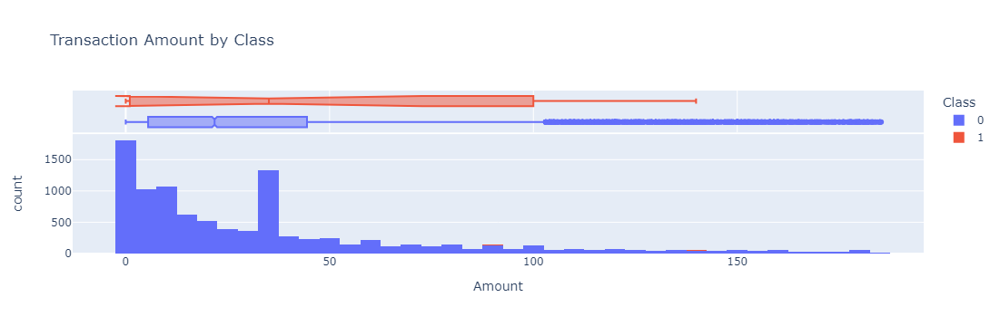

In [19]:

fig = px.histogram(df_sampled, x="Amount", color="Class", title='Transaction Amount by Class', marginal="box")
fig.show()


### Insights
1. **Distribution of Transaction Amounts:** The non-fraudulent transactions (Class 0) are distributed across a wide range of amounts, with a large number of transactions occurring at lower amounts. There’s a long tail extending towards higher transaction amounts, indicating that while most legitimate transactions are small, there are a few legitimate transactions with very high amounts.

2. **Fraudulent Transaction Amount:** The fraudulent transactions (Class 1) have a different distribution. While there are outliers on the higher end, the bulk of fraudulent transactions seem to be occurring at lower amounts. This suggests that fraudsters might be targeting transactions that are less likely to be flagged by high-amount transaction monitoring systems.

### Correlation HeatMap

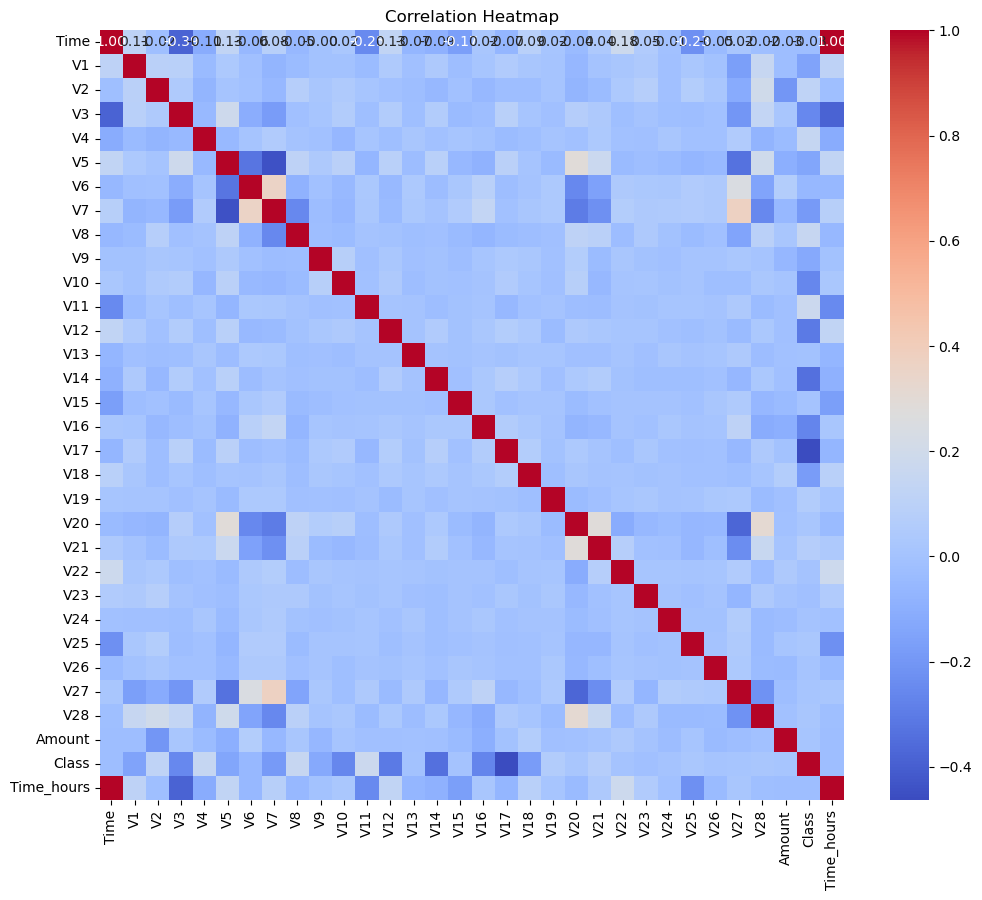

In [20]:
corr = df_sampled.corr()

# Set the figure size
plt.figure(figsize=(12, 10))

# Create a heatmap
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)

# Show the plot
plt.title('Correlation Heatmap')
plt.show()

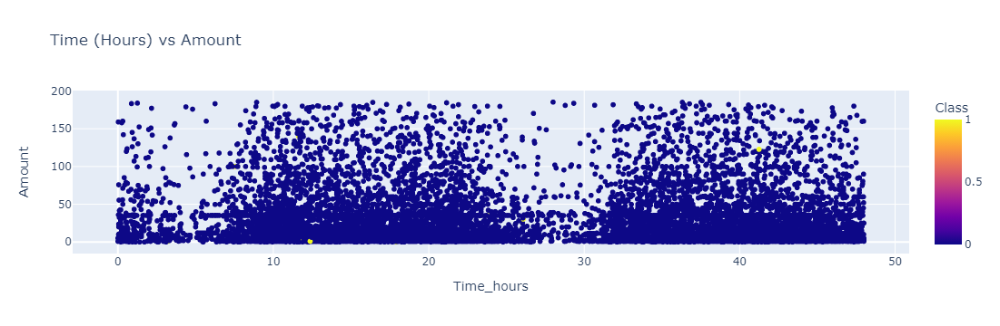

In [74]:
fig = px.scatter(df_sampled, x='Time_hours', y='Amount', color='Class', title='Time in Hours vs Amount')
fig.show()



### Insights

1. **Transaction Density:** There appears to be a high density of lower-amount transactions spread fairly evenly across the time period. This suggests that most transactions, both fraudulent and legitimate, are of lower amounts.

3. **Fraudulent Transactions:** Warmer colors indicate fraudulent transactions (Class 1), they do not seem to be clustered in a specific time period but rather are scattered throughout the time frame. This indicates that fraud can occur at any time.e.

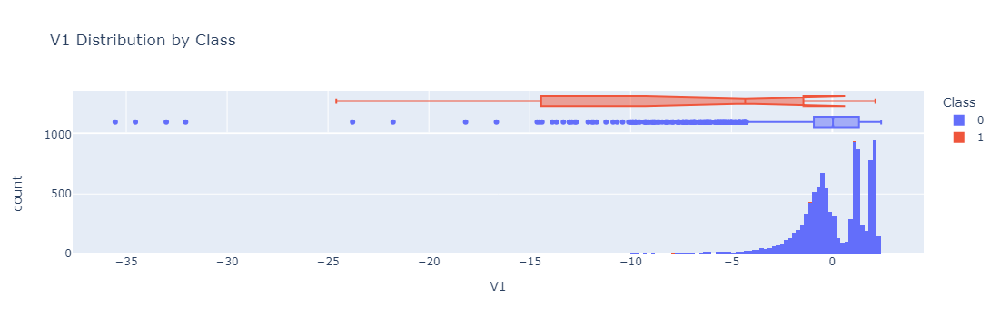

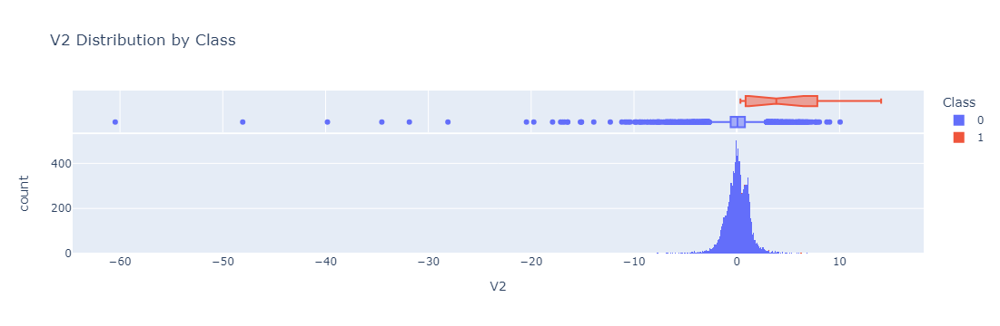

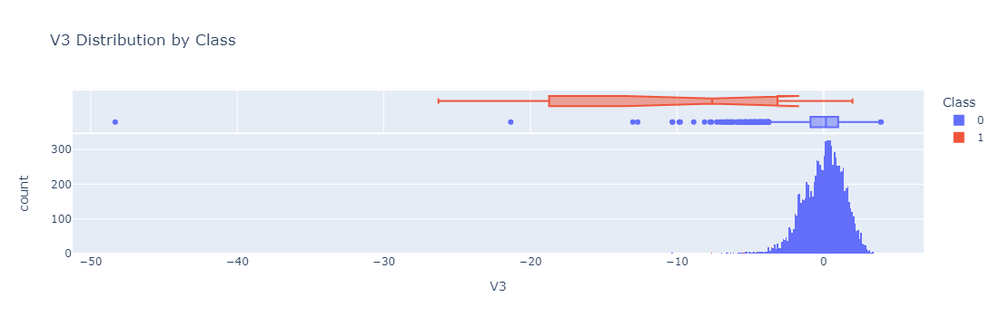

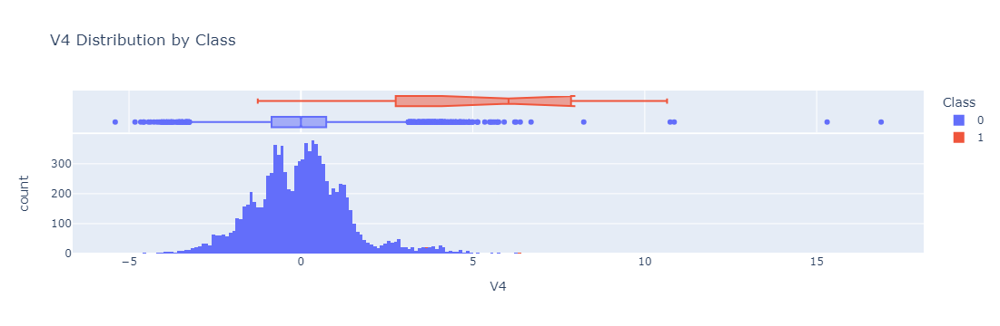

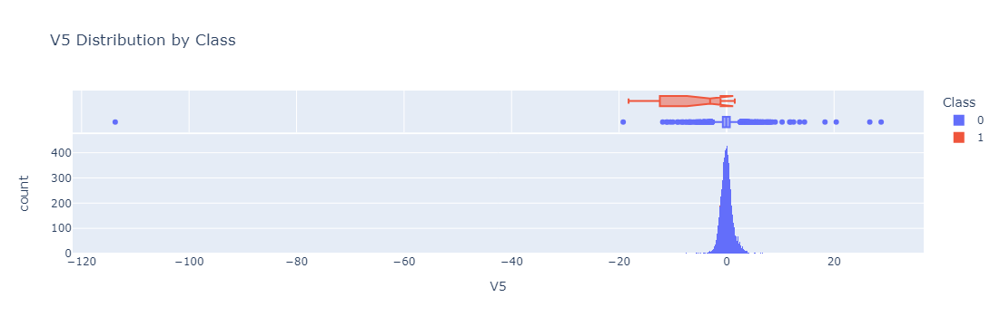

In [23]:
# Consider features based on preliminary findings
features = ['V1', 'V2', 'V3', 'V4', 'V5']

for feature in features:
    fig = px.histogram(df_sampled, x=feature, color='Class', marginal='box', title=f'{feature} Distribution by Class')
    fig.show()

### Insights


1. **Feature V1:**
The distribution for non-fraudulent transactions appears to be more spread out, whereas fraudulent transactions are more concentrated.

2. **Feature V2:**
This feature shows a pronounced difference in the distribution of the two classes, with fraudulent transactions having a different central tendency than non-fraudulent ones.

3. **Feature V3:**
Both classes exhibit a fairly normal distribution for non-fraudulent transactions, but there is a visible skew in the fraudulent transactions.
The skewness in the fraudulent transactions for V3 might indicate a pattern that fraud detection models can leverage.

4. **Feature V4:**
There is a significant difference in the distribution for V4, with fraudulent transactions showing a clear peak that is not present in the distribution of non-fraudulent transactions.

5. **Feature V5:**
The non-fraudulent transactions for V5 are more concentrated around the center, suggesting a tighter distribution.


In [29]:
df_sampled.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class', 'Time_hours'],
      dtype='object')

In [30]:
df_almost_ready = df_sampled.drop('Time', axis=1)


### Scalling the dataset

In [ ]:
from sklearn.preprocessing import RobustScaler

df_ready = df_almost_ready.copy()
df_ready['Amount'] = RobustScaler().fit_transform(df_ready['Amount'].to_numpy().reshape(-1, 1))
time = new_df['Time']
new_df['Time'] = (time - time.min()) / (time.max() - time.min())
new_df

In [33]:
df_almost_ready

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Time_hours
33560,-1.071719,-4.343904,-0.497727,-0.277591,-2.482346,-0.472073,0.991747,-0.414207,1.694252,-1.744176,...,0.013647,-1.183439,0.536058,0.064148,-0.016945,-0.179133,0.236036,35.112713,0,10.356389
57869,1.314915,-0.980378,-0.032665,-2.770975,-1.047365,-0.705180,-0.491240,-0.076395,0.571959,-0.673573,...,-0.481886,-0.009117,0.009622,0.555844,-0.836622,0.099256,0.014826,26.310000,0,13.365278
187479,-1.680526,-0.959150,-1.329705,-1.028361,-0.730922,0.253124,3.308312,-0.480062,0.157630,-2.012017,...,-0.204108,0.517400,-0.611013,-0.445912,-0.409744,0.231809,0.253554,35.112713,0,35.431667
243555,2.114488,0.169976,-2.051966,0.070326,0.481642,-1.819440,0.886700,-0.673729,0.077960,-0.006214,...,0.642597,-0.058720,0.128632,0.461792,0.234073,-0.082360,-0.075323,12.920000,0,42.215278
96229,-5.277692,3.487837,-1.201844,-0.192904,-0.158582,0.949549,0.467901,-0.788434,4.652615,7.407039,...,-1.077669,0.160074,-1.535126,0.873245,-0.322503,1.383375,0.758996,28.900000,0,18.243056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1.058605,-0.578154,1.084367,0.049894,-0.827569,0.872234,-0.933233,0.507671,1.018488,-0.361406,...,-0.119034,0.124776,-0.214339,-0.063831,0.984587,-0.010073,-0.001713,20.000000,0,7.961667
283663,-0.578642,1.356674,0.422771,-0.687057,1.092522,-0.496870,1.152116,-0.215570,-0.554547,-1.114415,...,-1.040318,-0.264888,0.535698,0.617122,0.285344,-0.389421,-0.048983,1.790000,0,47.714167
45611,-5.072816,-6.891157,2.226526,1.859573,5.987539,-3.479830,-4.519676,0.643465,-1.001390,1.514230,...,-0.602288,1.005951,-0.932581,0.562437,-0.088306,-0.302545,-0.013001,68.000000,0,11.783611
61352,1.081059,-0.130885,0.512434,1.281291,-0.285660,0.503406,-0.342561,0.311824,0.503121,0.032047,...,0.060189,-0.129230,-0.327946,0.588894,-0.263662,0.039227,0.007343,30.000000,0,13.830000


In [31]:
df_almost_ready.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class',
       'Time_hours'],
      dtype='object')

In [35]:
### Save final datafframe for model building

df_almost_ready.to_csv('df_almost_ready.csv', index=False)
